In [11]:
%load_ext autoreload

%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
%matplotlib inline
import matplotlib.pyplot as plt

In [13]:
from sdclane import config, utility, camera, line_detection

In [14]:
test_imgs = utility.read_rgb_imgs(config.test_img_files)

## test camera calibration on test images

In [15]:
undistort = camera.build_undistort_function()

Cannot find corner points in image
Cannot find corner points in image


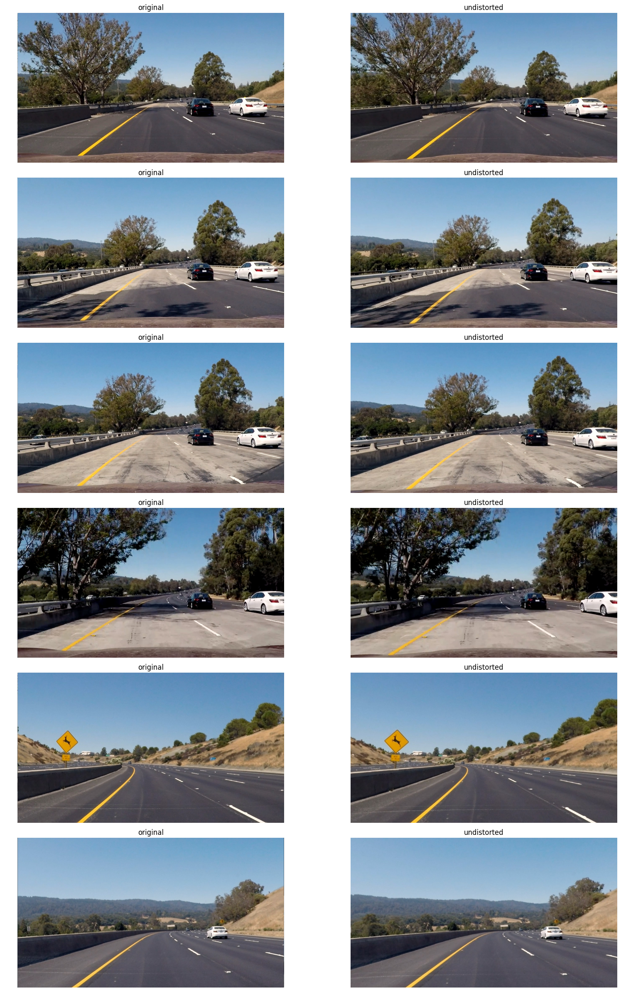

In [16]:
fig, axes = plt.subplots(6, 2, figsize = (8*2, 4*6))
fig.tight_layout()
fig.subplots_adjust(wspace = 0.1, hspace=0.1, )
for ax, test_img in zip(axes, test_imgs):
    ax[0].imshow(test_img)
    ax[0].set_title("original")
    ax[0].set_axis_off()
    undist = undistort(test_img)
    ax[1].imshow(undist)
    ax[1].set_title("undistorted")
    ax[1].set_axis_off()

## test line detection pipeline

In [17]:
detect_lines = line_detection.build_default_detect_lines_function()

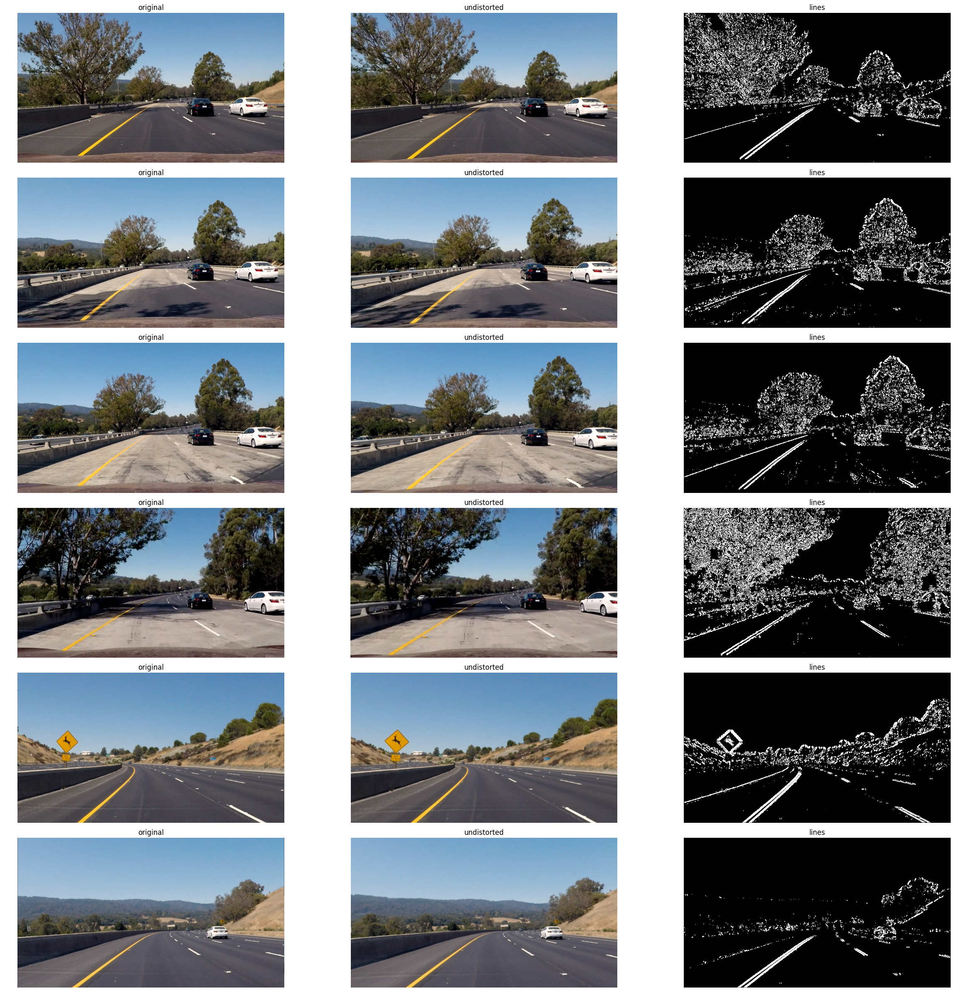

In [18]:
fig, axes = plt.subplots(6, 3, figsize = (8*3, 4*6))
fig.tight_layout()
fig.subplots_adjust(wspace = 0.1, hspace=0.1, )
for ax, test_img in zip(axes, test_imgs):
    ax[0].imshow(test_img)
    ax[0].set_title("original")
    ax[0].set_axis_off()
    
    test_img = undistort(test_img)
    ax[1].imshow(test_img)
    ax[1].set_title("undistorted")
    ax[1].set_axis_off()
    
    lines = detect_lines(test_img)
    ax[2].imshow(lines, cmap=plt.cm.gray)
    ax[2].set_title("lines")
    ax[2].set_axis_off()

## test perspective transform

In [35]:
from sdclane.transform import build_trapezoidal_bottom_roi_crop_function
from sdclane.transform import build_default_warp_transform_function

roi_crop = build_trapezoidal_bottom_roi_crop_function()
detect_roi_lines = utility.make_pipeline([undistort, detect_lines, roi_crop])
birdeye_transform, birdeye_binnary_transform = build_default_warp_transform_function()

Cannot find corner points in image
Cannot find corner points in image


/root/anaconda3/lib/python3.5/site-packages/skimage/measure/fit.py:57: skimage_deprecation: `LineModel` is deprecated, use `LineModelND` instead.
  warn(skimage_deprecation('`LineModel` is deprecated, '


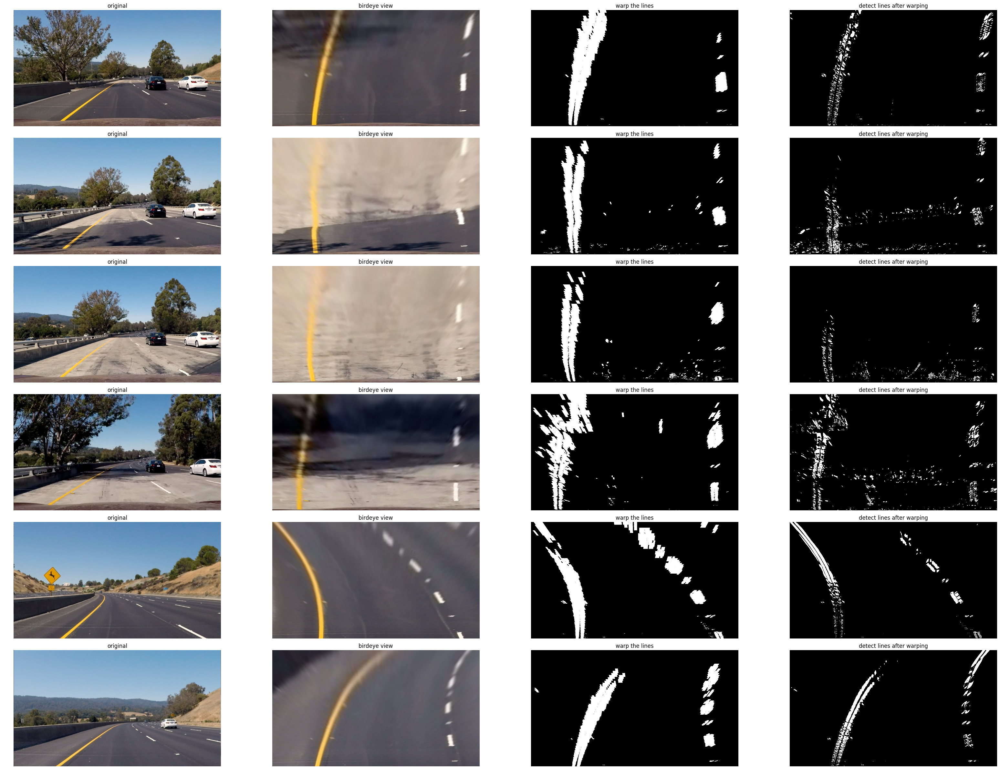

In [36]:
fig, axes = plt.subplots(6, 4, figsize = (8*4, 4*6))
fig.tight_layout()
fig.subplots_adjust(wspace = 0.1, hspace=0.1, )
for ax, img in zip(axes, test_imgs):
    ax[0].imshow(img)
    ax[0].set_title("original")
    ax[0].set_axis_off()
    
    warped_img = birdeye_transform(undistort(img))
    ax[1].imshow(warped_img)
    ax[1].set_title("birdeye view")
    ax[1].set_axis_off()
    
#     line_img = line_detector(warped_img)
    line_img = birdeye_binnary_transform(detect_roi_lines(img))
    ax[2].imshow(line_img, cmap=plt.cm.gray)
    ax[2].set_title("warp the lines")
    ax[2].set_axis_off()
    
    line_img = detect_lines(warped_img)
    ax[3].imshow(line_img, cmap=plt.cm.gray)
    ax[3].set_title("detect lines after warping")
    ax[3].set_axis_off()